### Task 1:
Test power rails. Use a power supply limited to 0.1 A.

1. Remove all jumpers from the board, and all other removable
components.
2. Set the power supply to 5V and verify the current limit (e.g. using a 5
Ohm load resistor).
3. Connect the power supply to the output of the converter (J6) - this is
the only time that we will do this! Double-check the polarity of the
connection.

A. Verify that LED2 (red) lights up. The current consumption should
be at 10 mA or less. Carefully increase the power supply voltage
to 18V and confirm that the power consumption remains at 15
mA or less.


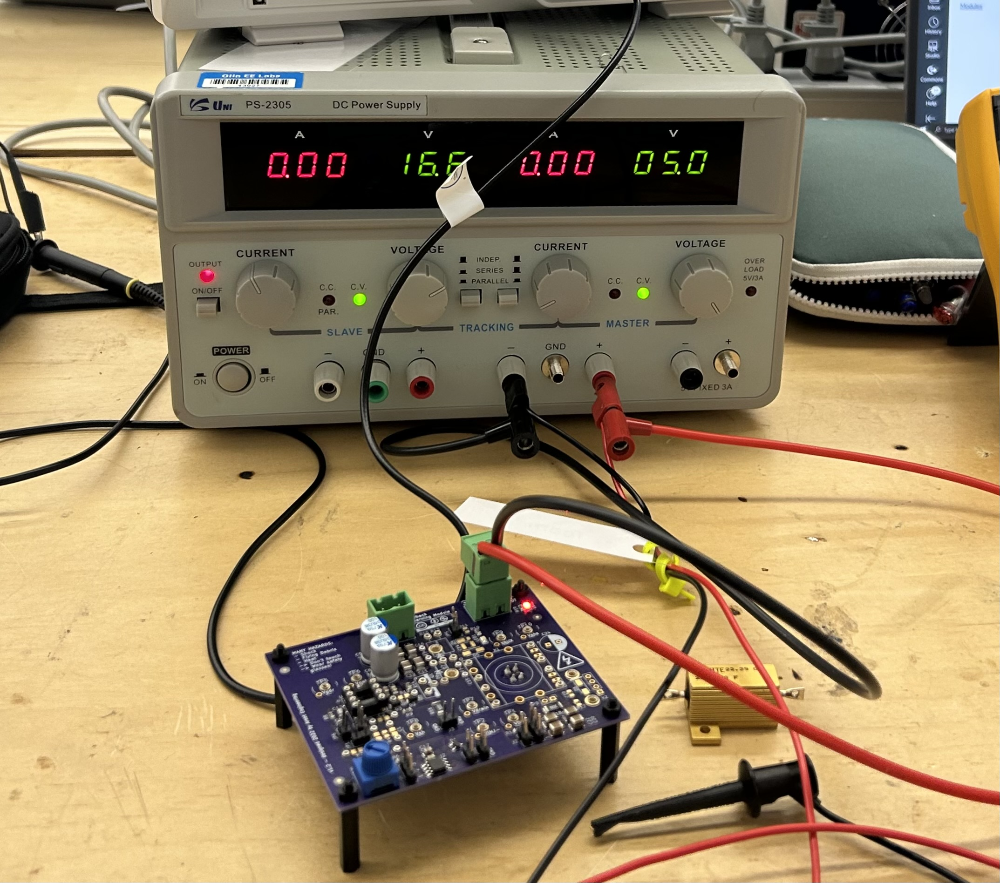

Power supply at 18V:

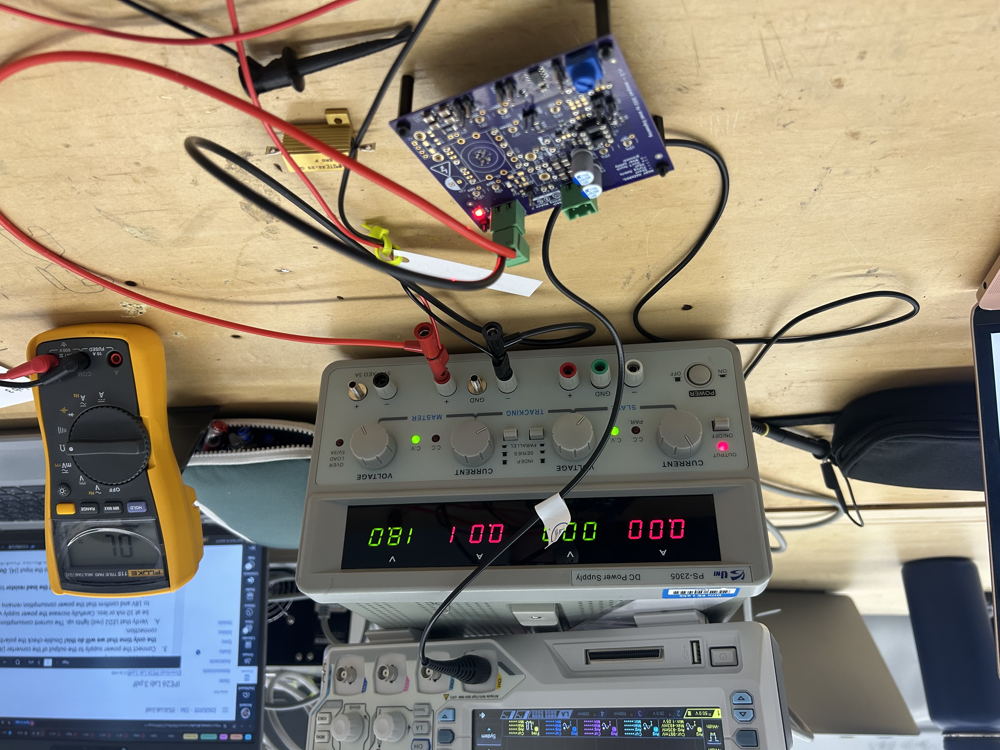

4. Disconnect the power supply and connect the load resistor to the
converter output (J6).
5. Set the power supply to 5V and connect it to the input (J4). Double

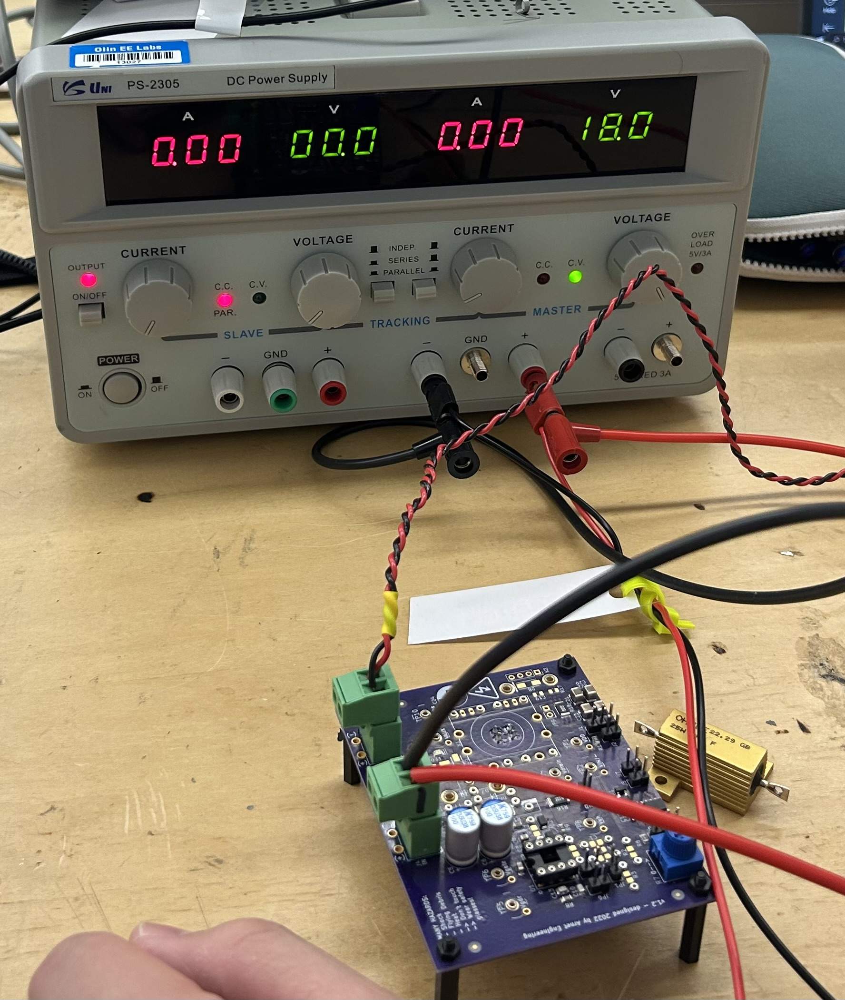

6. Set the power supply back to 5V and insert jumper JP5.

7. Verify that LED1 (green) lights up. Confirm that the current consumption remains at 15 mA or less up to 18V.
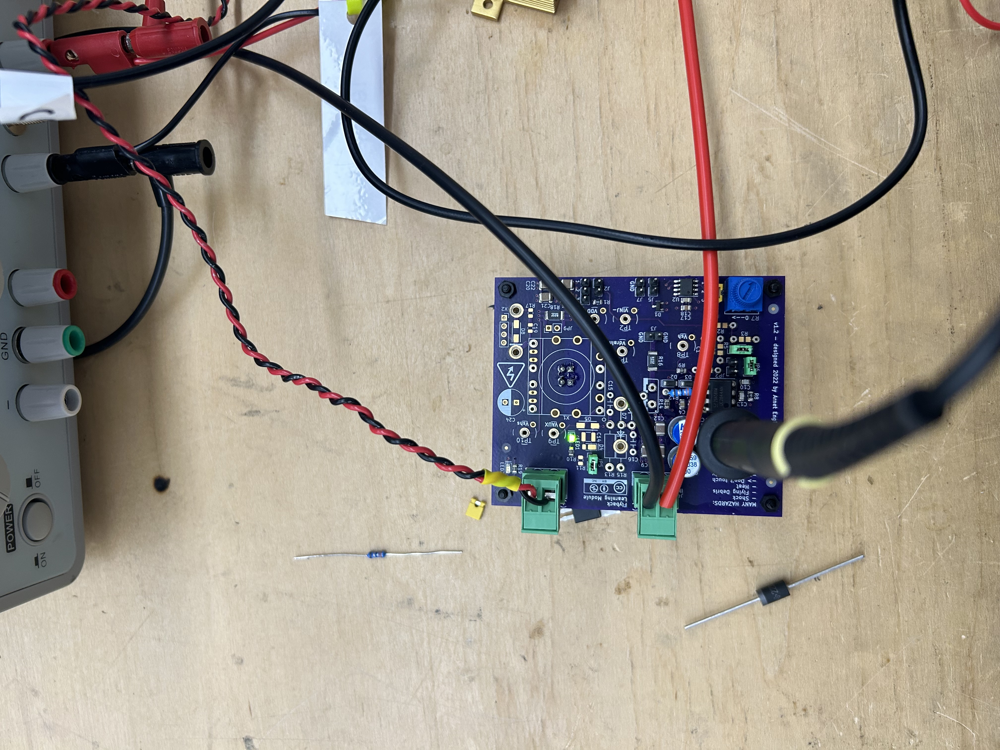


### TASK 2:
Test the basic operation of UC2844. Use a power supply limited to 0.1 A. With UC2844 in the U1 slot, JP1 and JP6 inserted, JP4 inserted in the 2-3 position, a 33 ohm gate resistor inserted, and the trim pot all the way clockwise (final state, I deleted the preparation steps): 

##### Q1: Measure the exact frequency, duty cycle and amplitude.

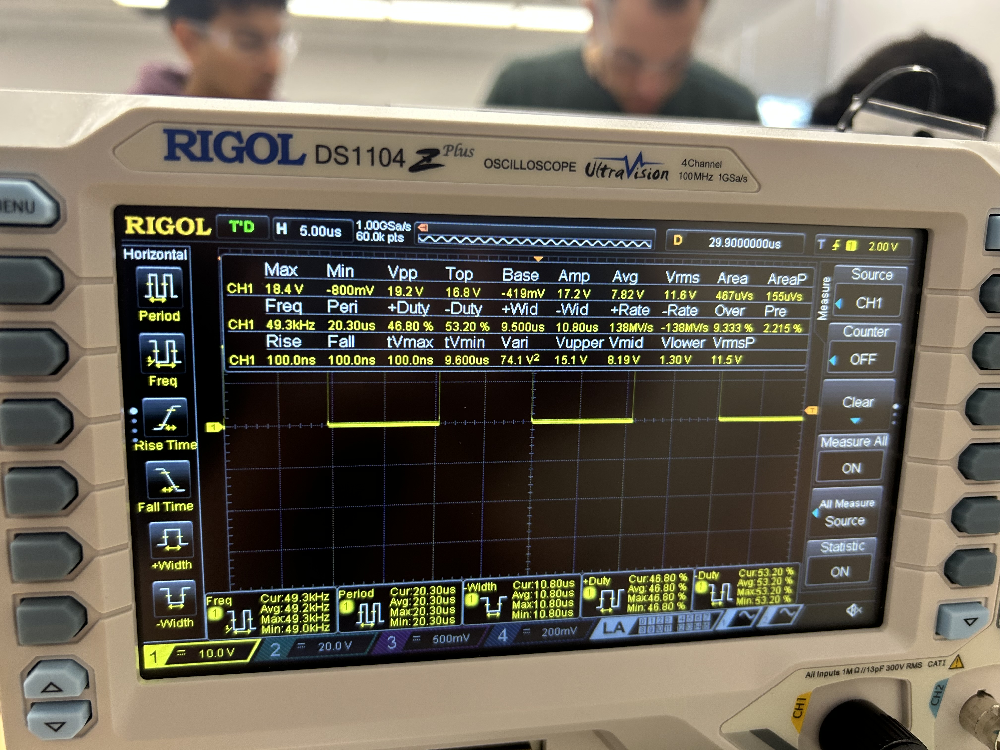

The oscilloscope shows that the frequency is 49.3kHz, duty cycle 46.80%, and amplitude is 17.2V. The wave blocked by the menu is a regular square wave.


### Task 3 (Preparation):
#### Q2: Make note of the label on the test inductor.
    Inductor 7

Plot the shunt voltage Vsh (TP8) and drain voltage Vdrain (TP7). Connect a DMM to measure the output voltage (J6).


### Task 3 (Execution): 
Plot the Vsh and drain Vdrain voltage measurements in Jupyter at 4V, 7V, and 9V to confirm quality and resolution. Log actual output voltages.


In [4]:
# Load in all files for analysis
import pandas as pd
from pathlib import Path

csv_dir = Path('./lab_3_power_e_2ch')
csv_files = list(csv_dir.glob('*.csv'))

test_data = {}

for csv_file in csv_files:
    df_name = csv_file.stem  # df same as file name
    test_data[df_name] = pd.read_csv(csv_file)
    print(f"Loaded {csv_file.name}")

Loaded t4d5_4v.csv
Loaded t4d5_9v.csv
Loaded t3d5_9v.csv
Loaded t2d7.csv
Loaded t3d5_4v.csv
Loaded t3d5_7v.csv
Loaded t4d5_7v.csv


### Task 3:
Plot shunt voltage Vsh (TP8) and drain voltage Vds (TP7) at 4V, 7V, and 9V output voltage.

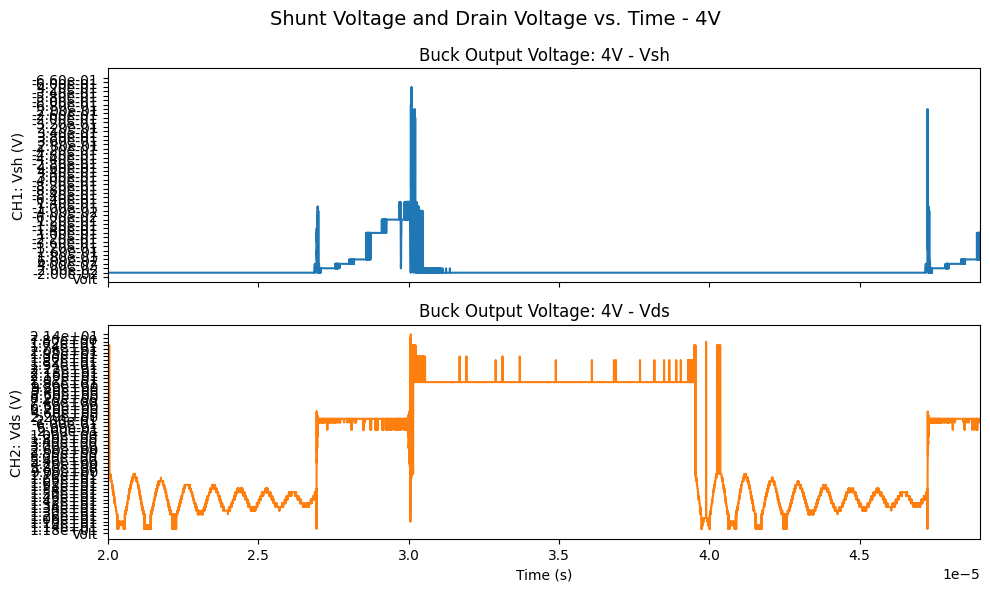

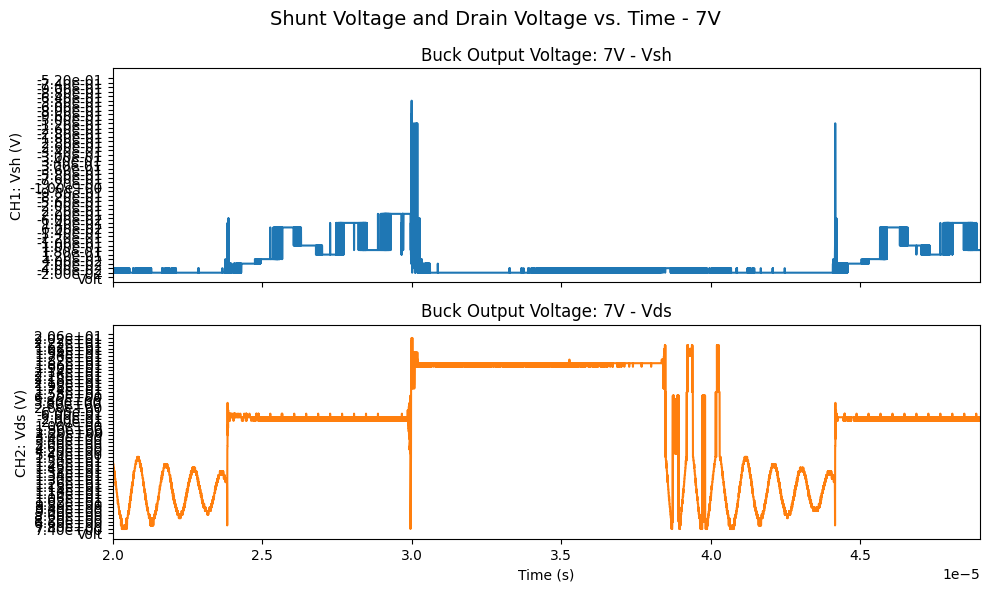

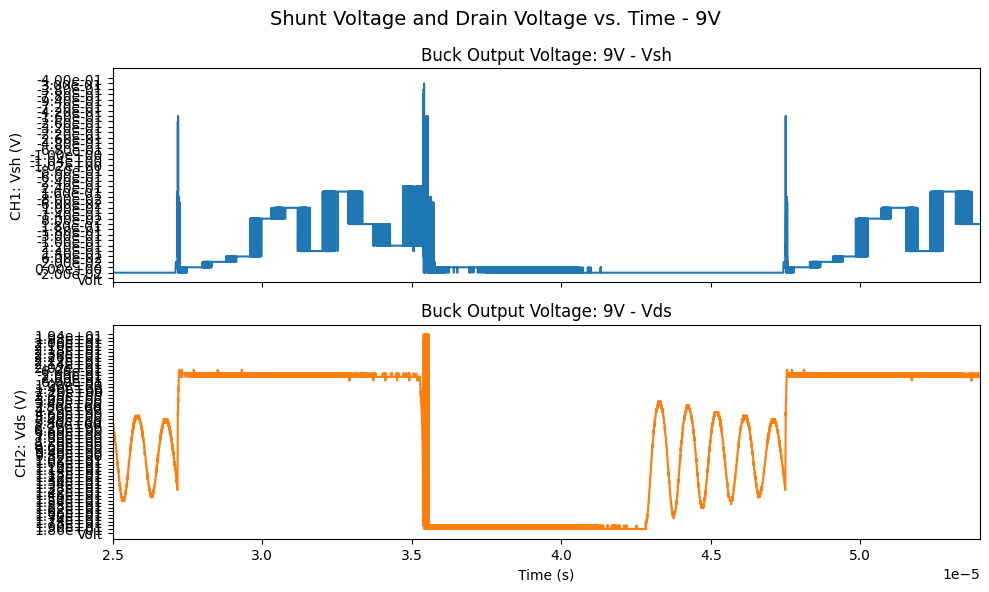

In [7]:
import matplotlib.pyplot as plt

t1 = test_data['t3d5_4v']['X'] * 2e-9
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 6), sharex=True)
fig.suptitle('Shunt Voltage and Drain Voltage vs. Time - 4V', fontsize=14)
ax1.plot(t1, test_data['t3d5_4v']['CH1'], color='tab:blue')
ax1.set_title('Buck Output Voltage: 4V - Vsh')
ax1.set_ylabel('CH1: Vsh (V)')
ax1.set_xlim(2e-5, 4.9e-5)
ax2.plot(t1, test_data['t3d5_4v']['CH2'], color='tab:orange')
ax2.set_title('Buck Output Voltage: 4V - Vds')
ax2.set_ylabel('CH2: Vds (V)')
ax2.set_xlabel('Time (s)')
ax2.set_xlim(2e-5, 4.9e-5)
plt.tight_layout()
plt.show()

t2 = test_data['t3d5_7v']['X'] * 2e-9
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 6), sharex=True)
fig.suptitle('Shunt Voltage and Drain Voltage vs. Time - 7V', fontsize=14)
ax1.plot(t2, test_data['t3d5_7v']['CH1'], color='tab:blue')
ax1.set_title('Buck Output Voltage: 7V - Vsh')
ax1.set_ylabel('CH1: Vsh (V)')
ax1.set_xlim(2e-5, 4.9e-5)
ax2.plot(t2, test_data['t3d5_7v']['CH2'], color='tab:orange')
ax2.set_title('Buck Output Voltage: 7V - Vds')
ax2.set_ylabel('CH2: Vds (V)')
ax2.set_xlabel('Time (s)')
ax2.set_xlim(2e-5, 4.9e-5)
plt.tight_layout()
plt.show()

t3 = test_data['t3d5_9v']['X'] * 2e-9
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 6), sharex=True)
fig.suptitle('Shunt Voltage and Drain Voltage vs. Time - 9V', fontsize=14)
ax1.plot(t3, test_data['t3d5_9v']['CH1'], color='tab:blue')
ax1.set_title('Buck Output Voltage: 9V - Vsh')
ax1.set_ylabel('CH1: Vsh (V)')
ax1.set_xlim(2.5e-5, 5.4e-5)
ax2.plot(t3, test_data['t3d5_9v']['CH2'], color='tab:orange')
ax2.set_title('Buck Output Voltage: 9V - Vds')
ax2.set_ylabel('CH2: Vds (V)')
ax2.set_xlabel('Time (s)')
ax2.set_xlim(2.5e-5, 5.4e-5)
plt.tight_layout()
plt.show()

### Task 4:
Plot gate driver output Vgdr (TP5) and gate voltage Vgate (TP6) at 4V, 7V, and 9V output voltage.

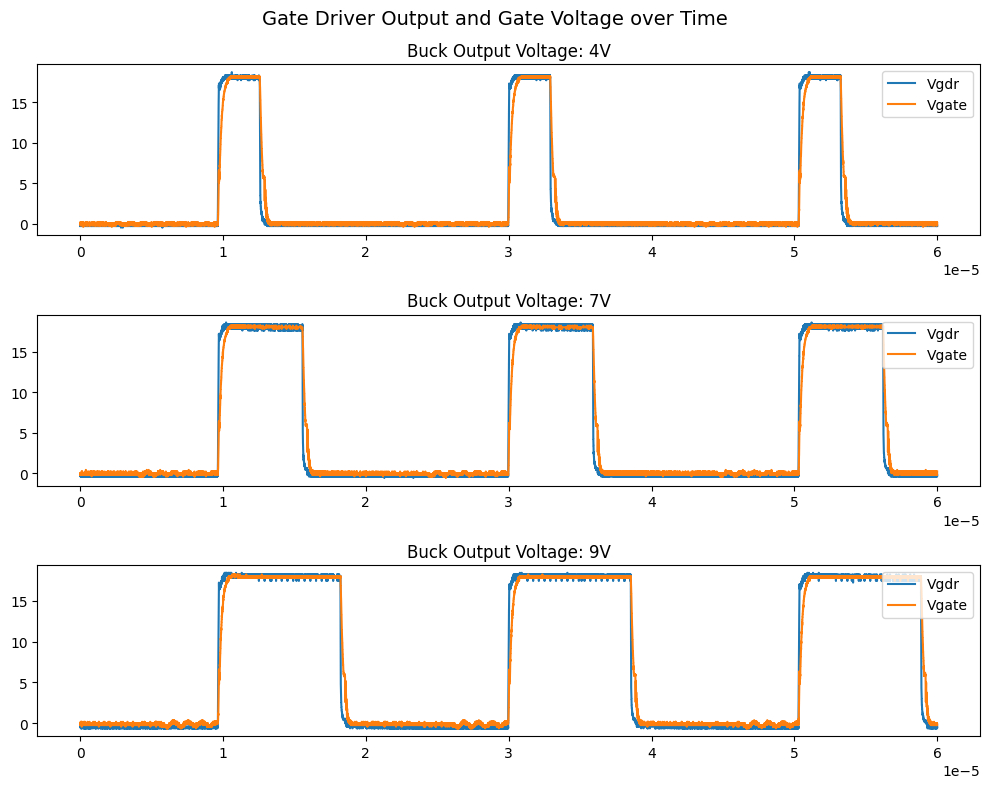

In [ ]:
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 8))
fig.suptitle('Gate Driver Output and Gate Voltage over Time', fontsize=14)

t1 = test_data['t4d5_4v']['X'] * 2e-9
ax1.plot(t1, test_data['t4d5_4v']['CH1'], label='Vgdr')
ax1.plot(t1, test_data['t4d5_4v']['CH2'], label='Vgate')
ax1.set_title('Buck Output Voltage: 4V')
ax1.set_xlim(t1.min(), t1.max() * 0.4)
ax1.set_xlabel('Time (s)')
ax1.set_ylabel('Voltage (V)')
ax1.legend(loc='upper right')

t2 = test_data['t4d5_7v']['X'] * 2e-9
ax2.plot(t2, test_data['t4d5_7v']['CH1'], label='Vgdr')
ax2.plot(t2, test_data['t4d5_7v']['CH2'], label='Vgate')
ax2.set_title('Buck Output Voltage: 7V')
ax2.set_xlim(t2.min(), t2.max() * 0.4)
ax2.set_xlabel('Time (s)')
ax2.set_ylabel('Voltage (V)')
ax2.legend(loc='upper right')

t3 = test_data['t4d5_9v']['X'] * 2e-9
ax3.plot(t3, test_data['t4d5_9v']['CH1'], label='Vgdr')
ax3.plot(t3, test_data['t4d5_9v']['CH2'], label='Vgate')
ax3.set_title('Buck Output Voltage: 9V')
ax3.set_xlim(t3.min(), t3.max() * 0.4)
ax3.set_xlabel('Time (s)')
ax3.set_ylabel('Voltage (V)')
ax3.legend(loc='upper right')

plt.tight_layout()
plt.show()

### Post lab analysis:

Q3: Use the measurements taken to determine:

1. the inductance value of the test inductor.

We know that the circuit is operating in discontinuous conduction mode because at each of the three different output levels, there exists a flat section where the voltage is 0 and no current is flowing.  Thus, we can use following equations to solve for L.

$D_{DCM} = \sqrt{\frac{k}{1-M}}*M$

$k=\frac{2L}{T_s*R}$

Then, we can plug in our measured values and get the following result:

In [ ]:
import numpy as np

# analyzing Vgdr for 7V case to find duty cycle
t = test_data['t4d5_7v']['X'].to_numpy() * 2e-9
v = test_data['t4d5_7v']['CH1'].to_numpy()

# threshold (50% of max)
thr = 0.5 * (v.max() + v.min())

# rising & falling edges
is_high = v > thr
edges = np.diff(is_high.astype(int))
rising = np.where(edges == 1)[0]
falling = np.where(edges == -1)[0]

if len(rising) > 1 and len(falling) > 0:
    r0 = rising[0]
    # first falling edge after r0
    f0 = falling[falling > r0][0]
    r1 = rising[rising > f0][0]

    t_on = t[f0] - t[r0]
    T = t[r1] - t[r0]
    duty = t_on / T
    print(f"Duty cycle: {duty*100:.2f}%")

TypeError: can't multiply sequence by non-int of type 'float'


2. Q4: Update your digital twin (PLECS model) with the inductance
value and measured switching frequency. Make sure you submit your
personal digital twin PLECS file with this lab report.
3. Q5: Run simulations corresponding to the measurements taken
during Task 3 and compare the waveforms (shape, amplitude, timing,
duty cycle) of the shunt-voltage and drain voltage.
4. Analyze the comparison and document your observations.
A. Q6: Are the simplifying assumptions made in our theoretical
study of the buck converter valid?
B. Q7: Does the measured peak-current and duty-cycle match the
theoretical predictions?
5. Use the measurements of Vgdr and Vgate taken during Task 4 to
determine the gate current during turn-on and turn-off transitions.
6. Q8: Plot the gate voltage and gate current during MOSFET turn-on
and turn-off for output voltages 4V, 7V and 9V.
7. Q9: Are we respecting maximal allowable gate voltage for the
MOSFET? Explain.
8. Q10: Are we respecting the maximal allowable output current of the
UC2844? Explain.